In [1]:
import pandas as pd
import plotly.express as px

import config
import load_fred
import pca_index


import pandas_datareader

DATA_DIR = config.DATA_DIR

import warnings
warnings.filterwarnings("ignore")

# CBOE Volatility Index (VIX)

In [2]:
# Load VIX data from FRED
df_vix = pandas_datareader.get_data_fred("VIXCLS", start="1998-01-01")

In [3]:
fig = px.line(df_vix)
fig.show()

# PCA Index Dashboard Examples

In [4]:
now = pd.Timestamp.utcnow()
# convert now to central time 
print(f"This script was last run at {now} (UTC)")
print(f"In US/Central Time, this is {now.tz_convert('US/Central')}")

This script was last run at 2024-12-01 10:21:12.744895+00:00 (UTC)
In US/Central Time, this is 2024-12-01 04:21:12.744895-06:00


In [5]:
df = load_fred.load_fred(data_dir=DATA_DIR)
dfn = pca_index.transform_series(df)

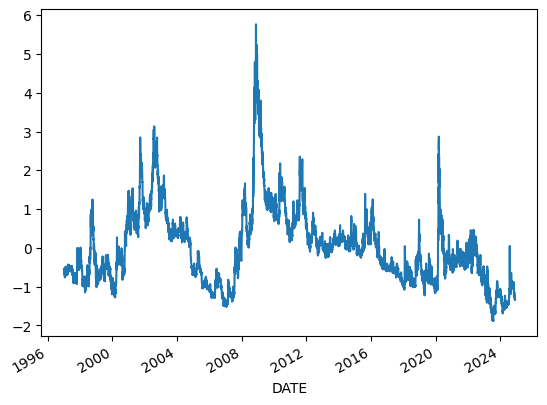

In [6]:
## Visualize Principal Component 1
pc1, loadings = pca_index.pca(dfn, module="scikitlearn")
pc1.plot();

In [7]:
# Simple version
fig = px.line(pc1)
fig.show()

In [8]:
# Using slider and quick views
pca_index.pc1_line_plot(pc1)

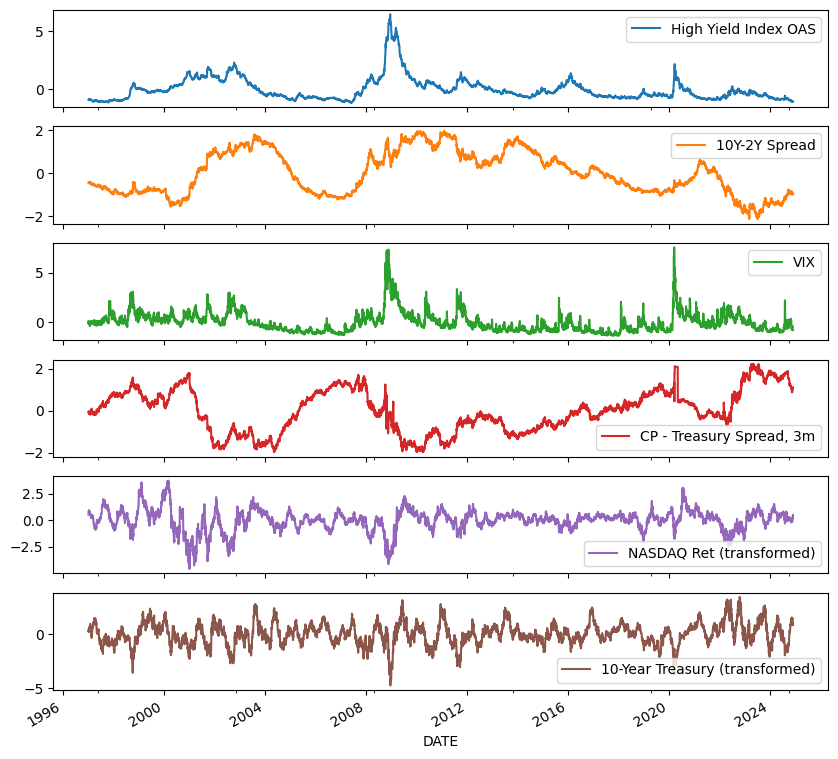

In [9]:
## Visualize normalized and raw series
dfn.plot(subplots=True, figsize=(10, 10));


In [10]:
fig = px.line(dfn, facet_col="variable", facet_col_wrap=1)
fig.update_yaxes(matches=None)
fig.show()


In [11]:
pca_index.plot_unnormalized_series(df)

In [12]:
pca_index.plot_normalized_series(dfn)